In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
from torch import nn
from torch.nn.functional import relu
from scipy.io import loadmat
import os
from os import listdir
import pandas as pd
from skimage import io
from PIL import Image

In [2]:
moving_files_dates = []
sleeping_files_dates = []
for f in os.listdir('/mnt/pesaranlab/People/Capstone_students/Noah/datav4/move/'):
    moving_files_dates.append(f[:6])
    
for f in os.listdir('/mnt/pesaranlab/People/Capstone_students/Noah/datav4/sleep/'):
    sleeping_files_dates.append(f[:6])

In [3]:
import pandas as pd
df_move = pd.DataFrame({'dates':moving_files_dates})
df_sleep = pd.DataFrame({'dates':sleeping_files_dates})

In [4]:
df_move.value_counts()

dates 
180327    1553
180330     808
180329     231
dtype: int64

In [5]:
df_sleep.value_counts()

dates 
180327    1184
180330     966
180329     885
dtype: int64

In [10]:
moving_files_train = []
moving_files_val = []
for f in os.listdir('/mnt/pesaranlab/People/Capstone_students/Noah/datav4/move/'):
    if np.load('/mnt/pesaranlab/People/Capstone_students/Noah/datav4/move/'+f).shape[2] == 100:
        x = np.load('/mnt/pesaranlab/People/Capstone_students/Noah/datav4/move/'+f)
        date = f.split('_')[0]
        rec = f.split('_')[1].split('_')[0]
        win = f.split('_')[3]
        if ('0329' not in f):
#             moving_files_train.append((torch.transpose(torch.from_numpy(x),1,2), torch.Tensor([0]), date, rec, win))
            moving_files_train.append((torch.from_numpy(x), torch.Tensor([0]), date, rec, win))
        else:
#             moving_files_val.append((torch.transpose(torch.from_numpy(x),1,2), torch.Tensor([0]), date, rec, win))
            moving_files_val.append((torch.from_numpy(x), torch.Tensor([0]), date, rec, win))
        
sleeping_files_train = []
sleeping_files_val = []
for f in os.listdir('/mnt/pesaranlab/People/Capstone_students/Noah/datav4/sleep/'):
    if np.load('/mnt/pesaranlab/People/Capstone_students/Noah/datav4/sleep/'+f).shape[2] == 100:
        x = np.load('/mnt/pesaranlab/People/Capstone_students/Noah/datav4/sleep/'+f)
        date = f.split('_')[0]
        rec = f.split('_')[1].split('_')[0]
        win = f.split('_')[3]
        if ('0329' not in f):
            sleeping_files_train.append((torch.transpose(torch.from_numpy(x),1,2), torch.Tensor([1]), date, rec, win))
            sleeping_files_train.append((torch.from_numpy(x), torch.Tensor([1]), date, rec, win))
        else:
            sleeping_files_val.append((torch.from_numpy(x), torch.Tensor([1]), date, rec, win))

In [11]:
len(moving_files_train)

2361

date: 180327
recording: 007
window: win196
label (move = 0, sleep = 1): tensor([0.])


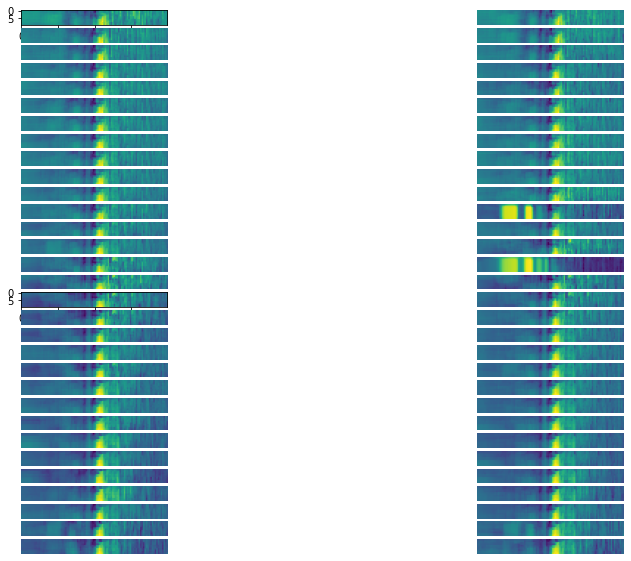

In [15]:
for i in moving_files_train:
    data = i[0]
    labels = i[1]
    date = i[2]
    rec = i[3]
    win = i[4]
    
#     print(str(date), str(rec), str(win))
    if ((str(date) == '180327') and (str(rec) == '007') and (str(win) == 'win196')):
        print('date: '+str(date))
        print('recording: '+str(rec))
        print('window: ' +str(win))
        print('label (move = 0, sleep = 1): ' +str(labels))

        plt.figure(figsize=(15,10))
        for channel in range(62):
            plt.subplot(31,2,channel+1)
            plt.imshow(data[channel].cpu().detach().numpy())
            if (channel != 0) and (channel != 32):
                plt.axis('off')

In [10]:
c

0

In [7]:
len(moving_files_train), len(sleeping_files_train)

(2361, 2150)

In [8]:
import random
diff_train = len(moving_files_train)-len(sleeping_files_train)
for i in range(diff_train):
    ind = random.randint(0,len(sleeping_files_train)-1)
    x= sleeping_files_train[ind]
    sleeping_files_train.append(x)

In [9]:
len(moving_files_train), len(sleeping_files_train)

(2361, 2361)

In [10]:
class NoahSpectrogramDataset(Dataset):
    def __init__(self, mode='train',moving_files_train=moving_files_train,sleeping_files_train=sleeping_files_train,moving_files_val=moving_files_val,sleeping_files_val=sleeping_files_val):
        if mode == 'train':
            self.all_files = moving_files_train+sleeping_files_train
        elif mode == 'valid':
            self.all_files = moving_files_val+sleeping_files_val
            
    def __len__(self):
        return len(self.all_files)
    
    def __getitem__(self, idx):
        return self.all_files[idx]

In [11]:
train_dataset = NoahSpectrogramDataset(mode='train')
valid_dataset = NoahSpectrogramDataset(mode='valid')

In [12]:
train_loader = DataLoader(dataset = train_dataset, batch_size = 16, shuffle = True)
val_loader = DataLoader(dataset = valid_dataset, batch_size = 16, shuffle = False)

In [13]:
for batch_idx, (data, labels, date, rec) in enumerate(train_loader):
    print(data.shape)
    print(data.reshape([data.shape[0],1,-1]).shape)
    print(labels.shape)
    break

torch.Size([16, 62, 100, 10])
torch.Size([16, 1, 62000])
torch.Size([16, 1])


printing all channels of first 5 batches
batch number: 0
date: 180330
recording: 008
label (move = 0, sleep = 1): tensor([0.])


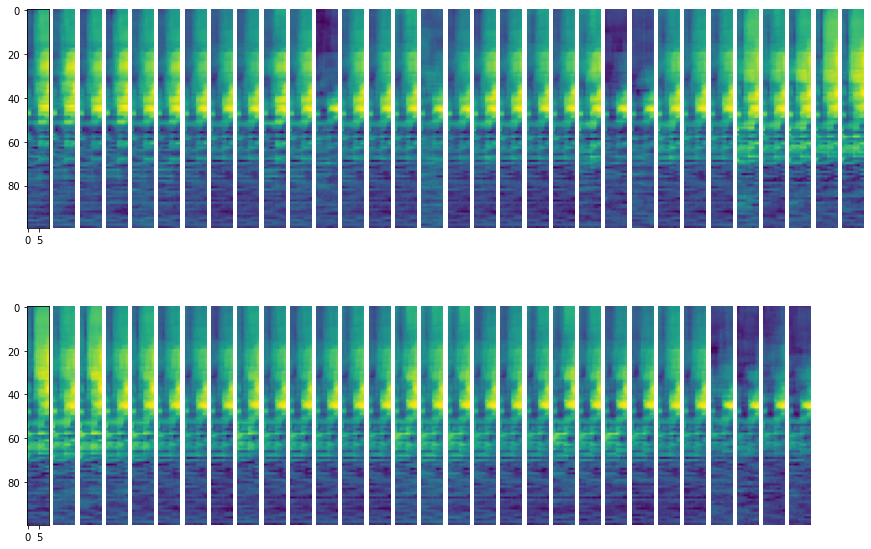

batch number: 1
date: 180327
recording: 007
label (move = 0, sleep = 1): tensor([0.])


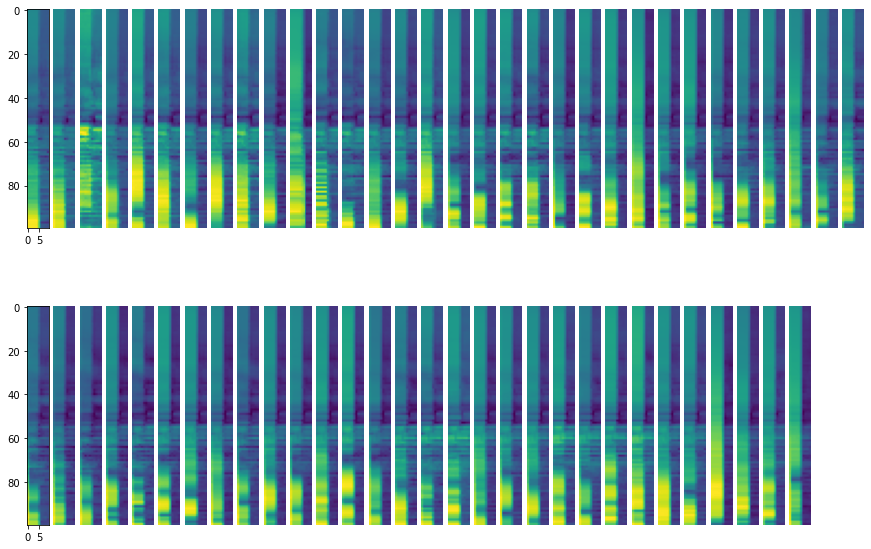

batch number: 2
date: 180327
recording: 006
label (move = 0, sleep = 1): tensor([1.])


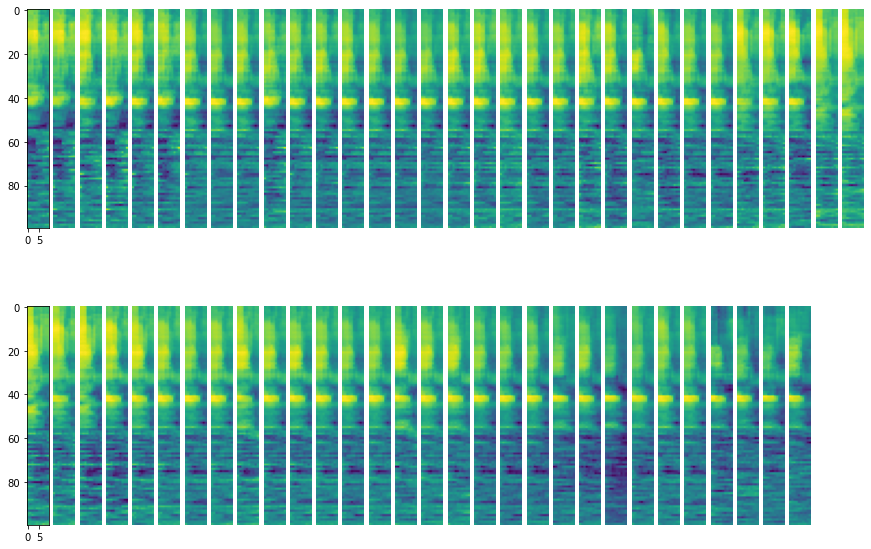

batch number: 3
date: 180330
recording: 004
label (move = 0, sleep = 1): tensor([1.])


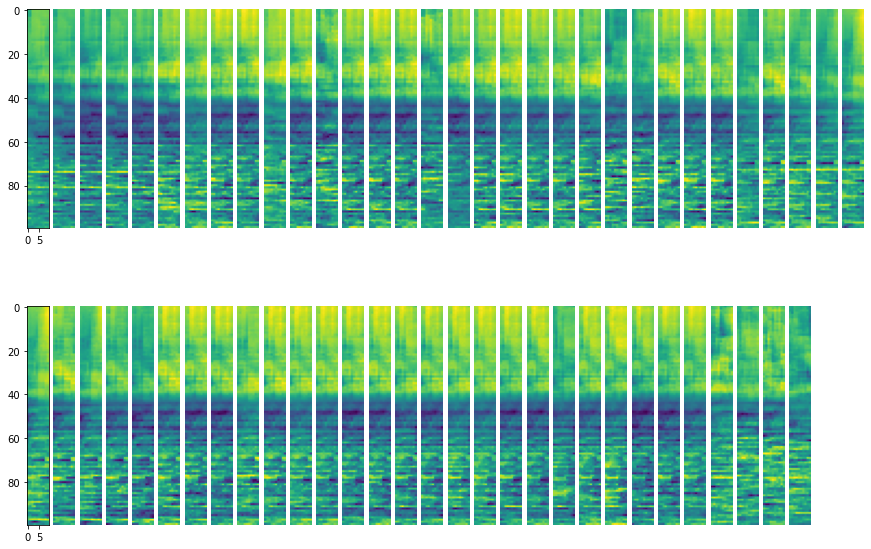

batch number: 4
date: 180330
recording: 008
label (move = 0, sleep = 1): tensor([0.])


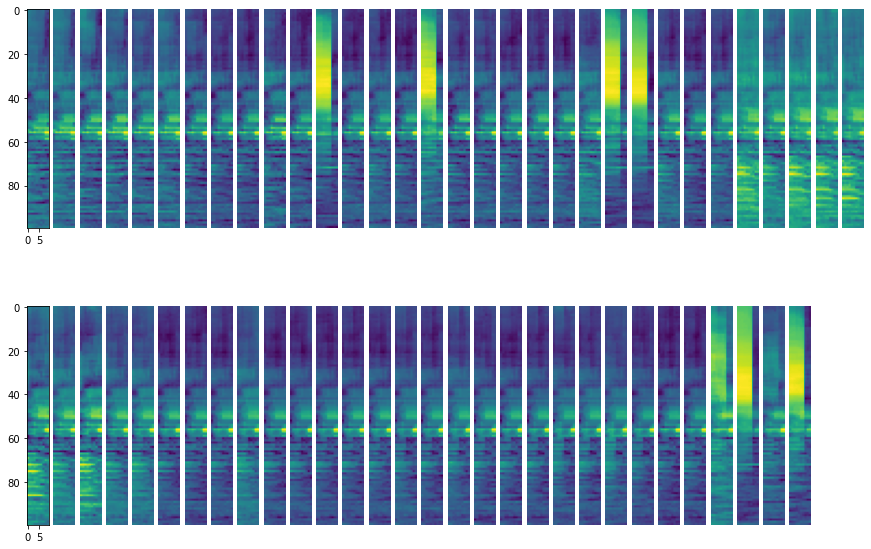

batch number: 5
date: 180330
recording: 006
label (move = 0, sleep = 1): tensor([1.])


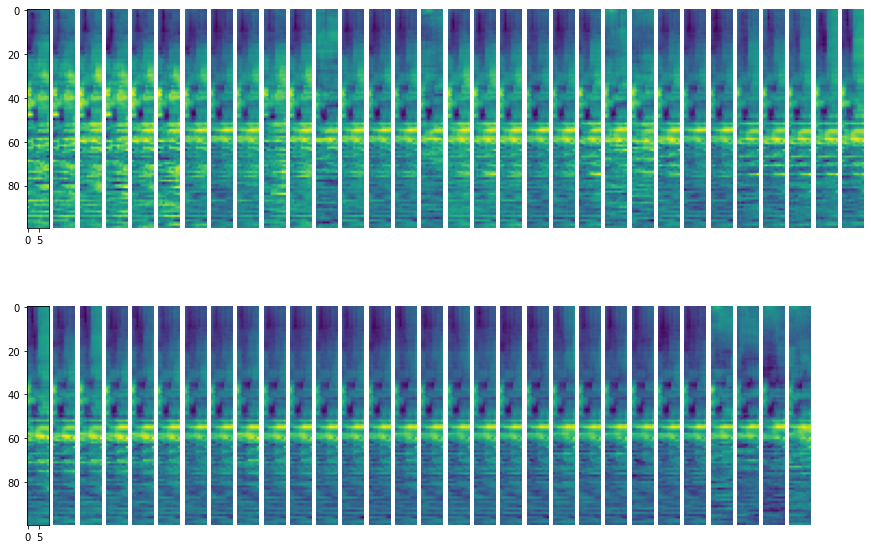

batch number: 6
date: 180327
recording: 001
label (move = 0, sleep = 1): tensor([0.])


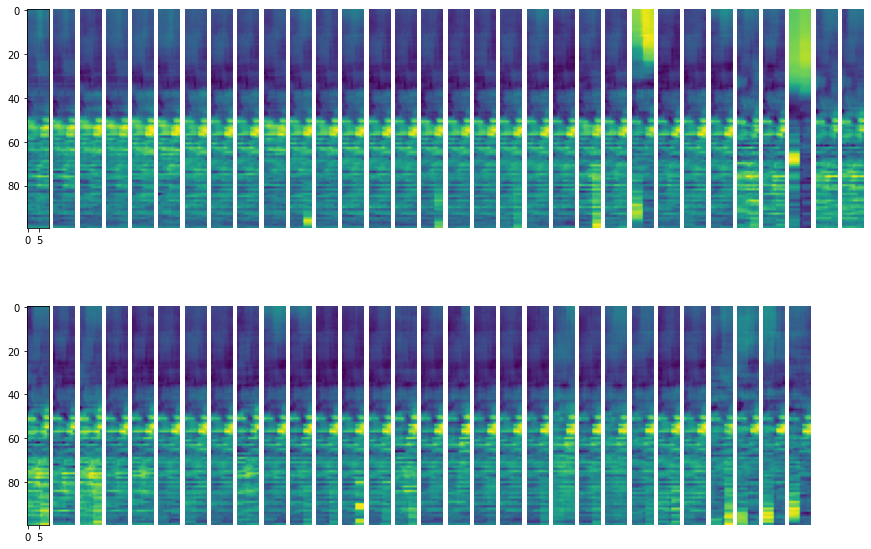

batch number: 7
date: 180330
recording: 004
label (move = 0, sleep = 1): tensor([1.])


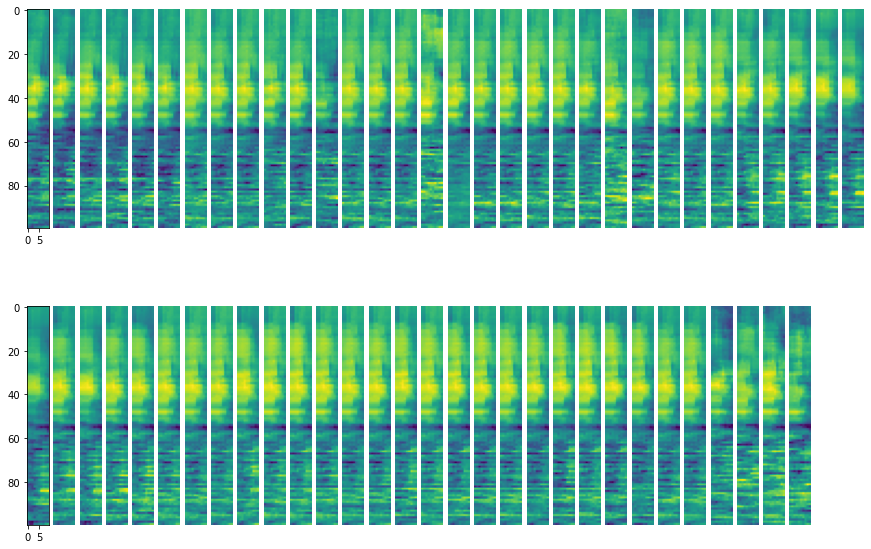

batch number: 8
date: 180330
recording: 007
label (move = 0, sleep = 1): tensor([1.])


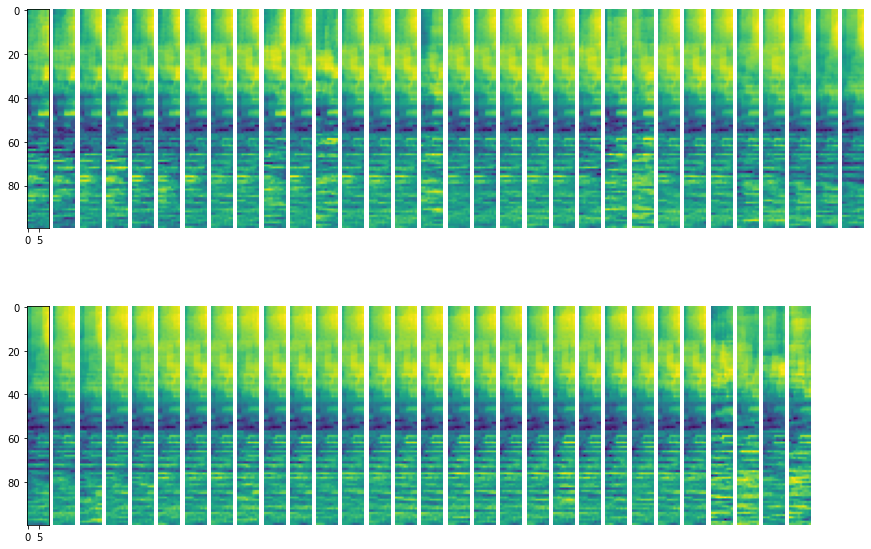

batch number: 9
date: 180327
recording: 007
label (move = 0, sleep = 1): tensor([0.])


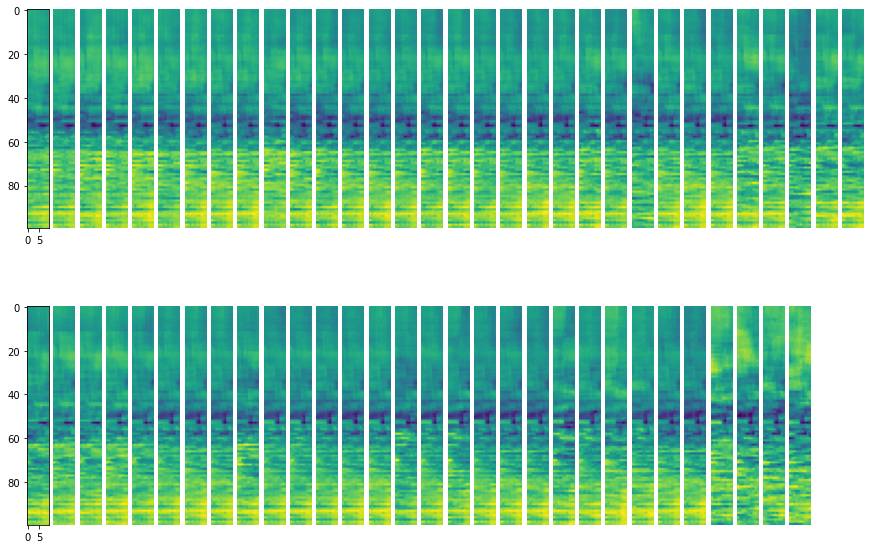

batch number: 10
date: 180330
recording: 008
label (move = 0, sleep = 1): tensor([0.])


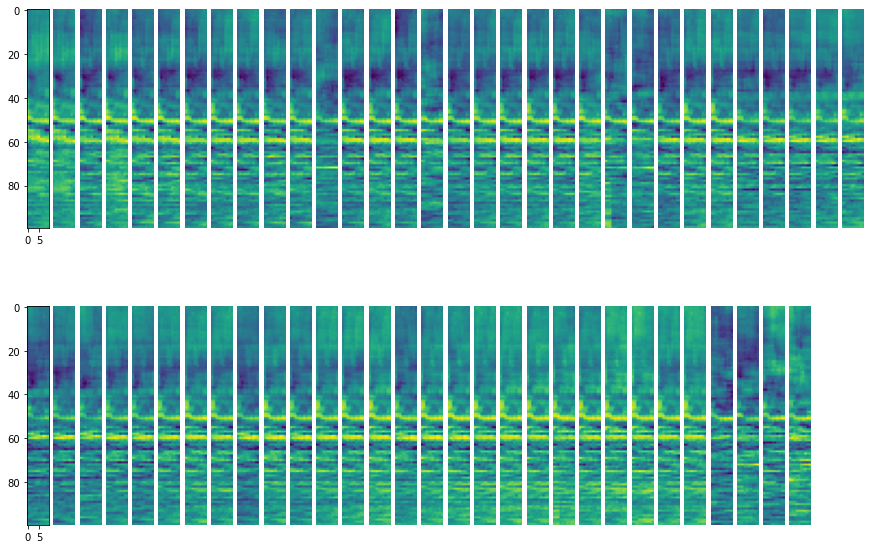

In [16]:
print('printing all channels of first 5 batches')
for batch_idx, (data, labels, date, rec) in enumerate(train_loader):
    print('batch number: '+str(batch_idx))
    print('date: '+str(date[0]))
    print('recording: '+str(rec[0]))
    print('label (move = 0, sleep = 1): ' +str(labels[0]))
    plt.figure(figsize=(15,10))
    for channel in range(62):
        plt.subplot(2,32,channel+1)
        plt.imshow(data[0][channel].cpu().detach().numpy())
        if (channel != 0) and (channel != 32):
            plt.axis('off')
    plt.show()
    if batch_idx == 10:
        break

# Train and Test

In [38]:
def train(loader, epoch):
    model.train()
    batch_losses = []
    preds = []
    labs = []
    
    correct = 0
    total = 0
    
    for batch_idx, (data, labels, date, rec) in enumerate(loader):
        data = data.to(device)
        labels = labels.to(device).float()
        
        if (torch.isinf(data).any()) or (torch.isnan(data).any()):
            continue
        if batch_idx % 50 == 0 and epoch == 0:
            print('Showing Train Images')
            print('batch number: '+str(batch_idx))
            print('label (move = 0, sleep = 1): ' +str(labels[0]))
            plt.figure(figsize=(15,10))
            for channel in range(62):
                plt.subplot(2,32,channel+1)
                plt.imshow(data[0][channel].cpu().detach().numpy())
                if (channel != 0) and (channel != 32):
                    plt.axis('off')
            plt.show()
        
        output, conv1, conv2 = model(data)
        loss = criterion(output.reshape(output.shape[0],-1), labels)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        batch_losses.append(loss)
        
        predictions = []
        for o in output:
            if o.item() > .5:
                predictions.append(1)
            else:
                predictions.append(0)
        predictions = np.array(predictions)
        total += labels.size(0)
        correct += (predictions.flatten() == labels.flatten().cpu().numpy()).sum().item()
        preds.append(predictions.flatten())
        labs.append(labels.flatten().cpu().numpy())
        
    
    epoch_loss = sum(batch_losses)/len(batch_losses)
    accuracy = correct / total
    
    return epoch_loss, accuracy, preds, labs

In [39]:
def test(loader, epoch):
    model.eval()
    batch_losses = []
    preds = []
    labs = []
    
    correct = 0
    total = 0
    
    with torch.no_grad():
        for batch_idx, (data, labels, date, rec) in enumerate(loader):
            data = data.to(device)
            labels = labels.to(device).float().flatten()
            
            if (torch.isinf(data).any()) or (torch.isnan(data).any()):
                continue
            if batch_idx % 10 == 0 and epoch == 0:
                print('Showing Val Images')
                print('Showing Train Images')
                print('batch number: '+str(batch_idx))
                print('label (move = 0, sleep = 1): ' +str(labels[0]))
                plt.figure(figsize=(15,10))
                for channel in range(62):
                    plt.subplot(2,32,channel+1)
                    plt.imshow(data[0][channel].cpu().detach().numpy())
                    if (channel != 0) and (channel != 32):
                        plt.axis('off')
                plt.show()
            
            output, conv1, conv2 = model(data)
            loss = criterion(output, labels)
            
            batch_losses.append(loss)
            
            #get accuracy
            predictions = []
            for o in output:
                if o.item() > .5:
                    predictions.append(1)
                else:
                    predictions.append(0)
            predictions = np.array(predictions)
            total += labels.size(0)
            correct += (predictions.flatten() == labels.flatten().cpu().numpy()).sum().item()
            preds.append(predictions.flatten())
            labs.append(labels.flatten().cpu().numpy())
        
        epoch_loss = sum(batch_losses)/len(batch_losses)
        accuracy = correct/total
        
        return epoch_loss, accuracy, preds, labs

# Model

In [40]:
class CNN(nn.Module):
    def __init__(self, in_channels = 62, num_classes = 1):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=62, out_channels=124, kernel_size=(3,3), stride = (1,1), padding = (1,1))
        self.conv2 = nn.Conv2d(in_channels=124, out_channels=248, kernel_size=(3,3), stride = (1,1), padding = (1,1))
        self.fc1 = nn.Linear(248*10*100, num_classes)
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, x, verbose=True):
        x = x.float()
        x1 = relu(self.conv1(x))
        x2 = relu(self.conv2(x1))
        x = x2.reshape(x2.shape[0], -1)
        x = self.fc1(x).flatten()
        x = self.sigmoid(x)
        return x, x1, x2

In [41]:
input_size = 1000 #(10x100)
num_classes = 1
learning_rate = 0.001
num_epochs = 15

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


Showing Train Images
batch number: 0
label (move = 0, sleep = 1): tensor([1.], device='cuda:0')


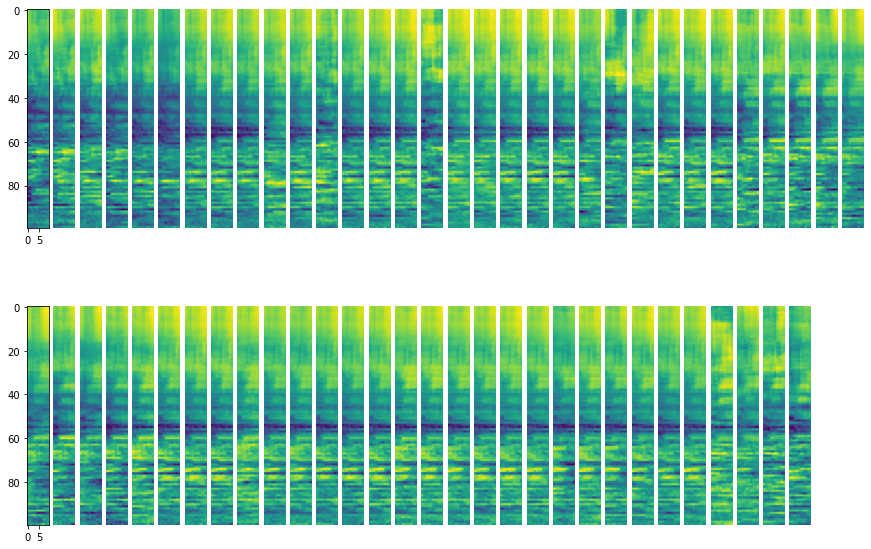

Showing Train Images
batch number: 50
label (move = 0, sleep = 1): tensor([1.], device='cuda:0')


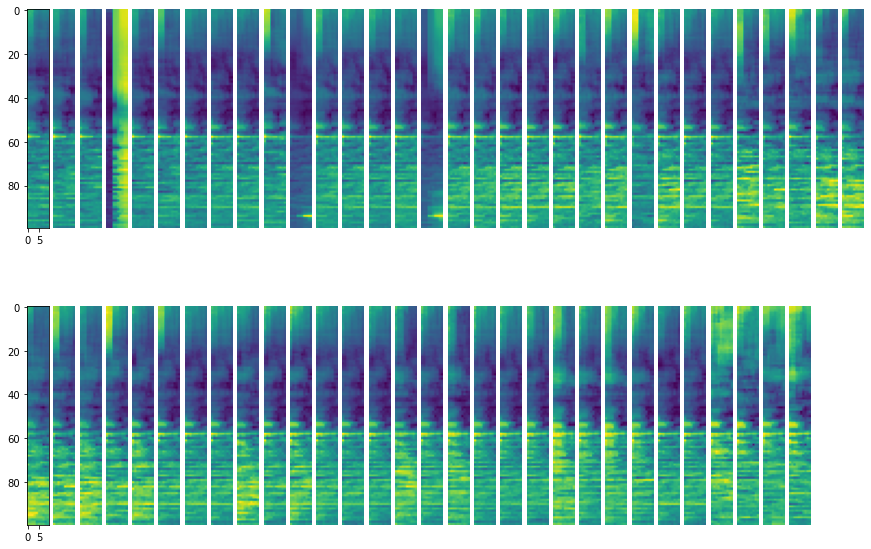

Showing Train Images
batch number: 150
label (move = 0, sleep = 1): tensor([1.], device='cuda:0')


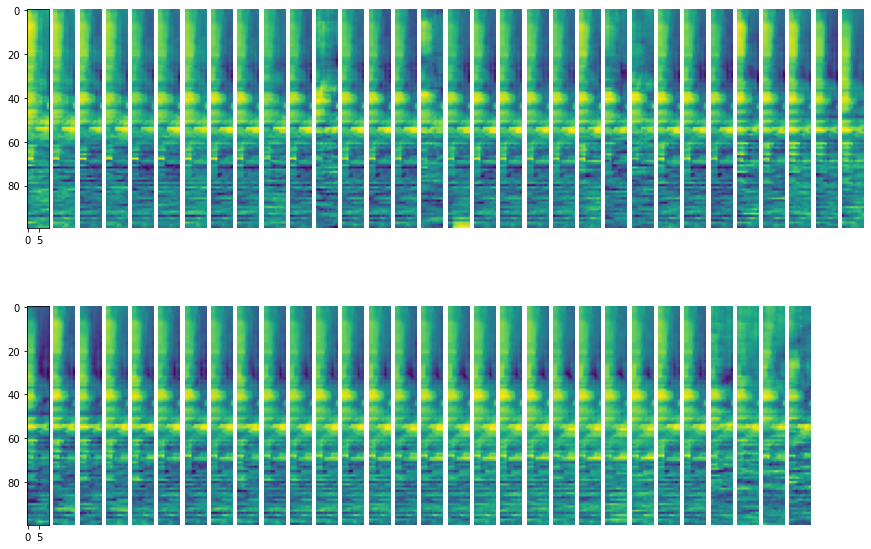

Train loss for epoch 0: 1.0959044694900513
Showing Val Images
Showing Train Images
batch number: 0
label (move = 0, sleep = 1): tensor(0., device='cuda:0')


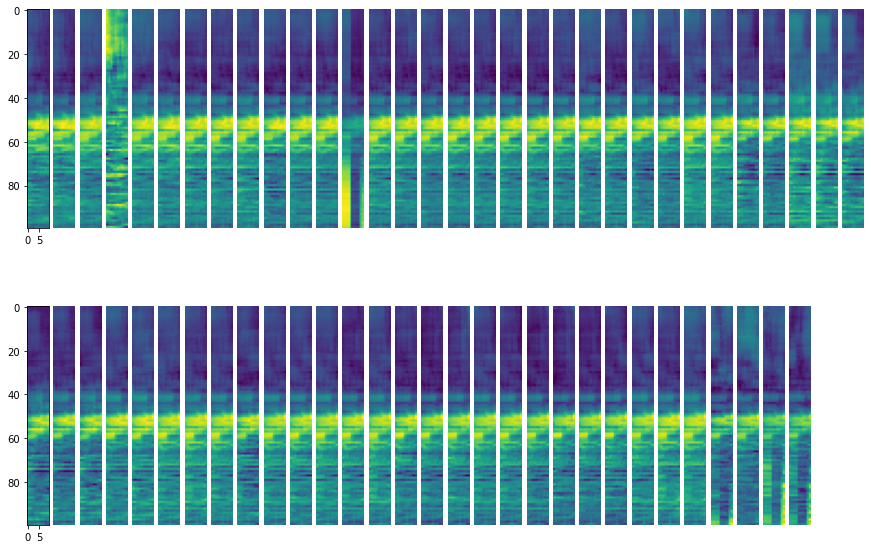

Showing Val Images
Showing Train Images
batch number: 10
label (move = 0, sleep = 1): tensor(0., device='cuda:0')


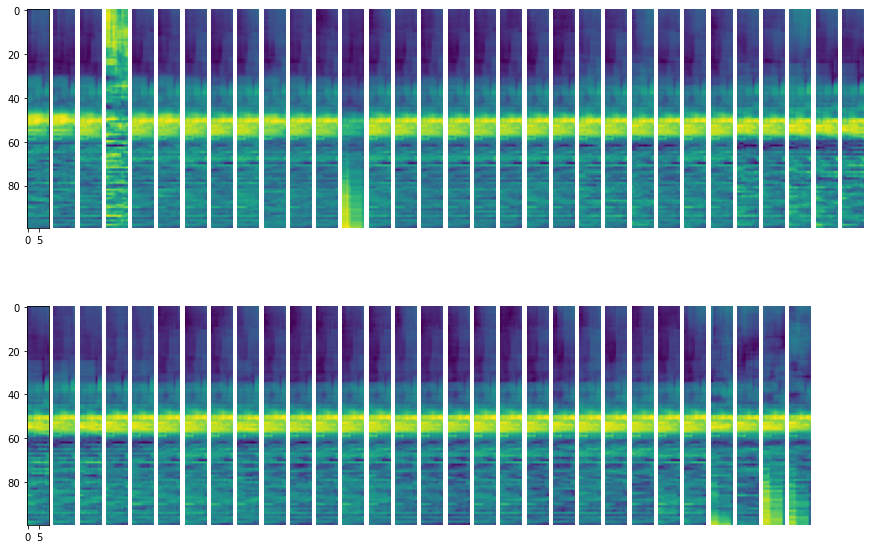

Showing Val Images
Showing Train Images
batch number: 20
label (move = 0, sleep = 1): tensor(1., device='cuda:0')


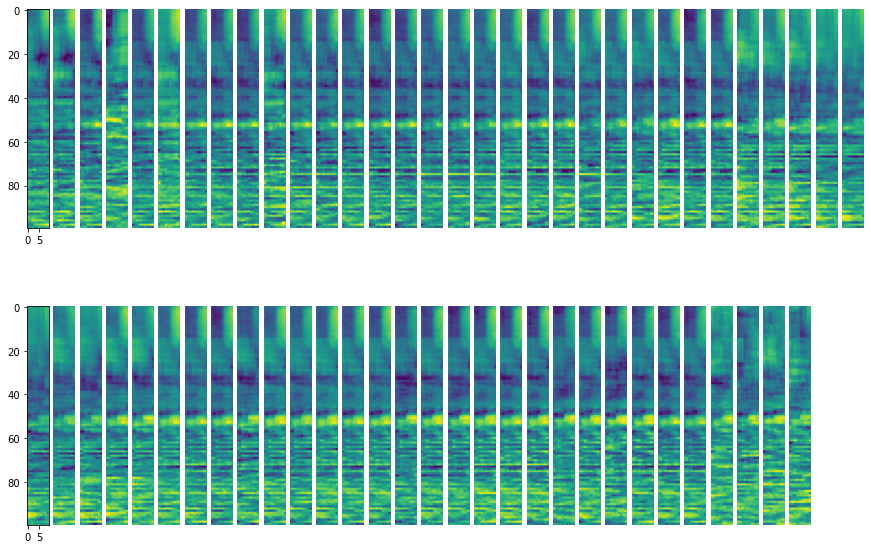

Showing Val Images
Showing Train Images
batch number: 30
label (move = 0, sleep = 1): tensor(1., device='cuda:0')


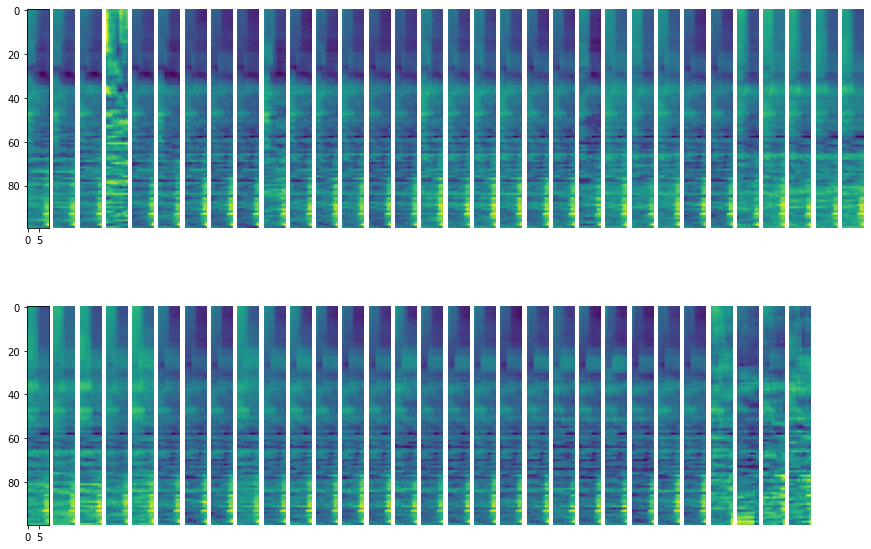

Showing Val Images
Showing Train Images
batch number: 40
label (move = 0, sleep = 1): tensor(1., device='cuda:0')


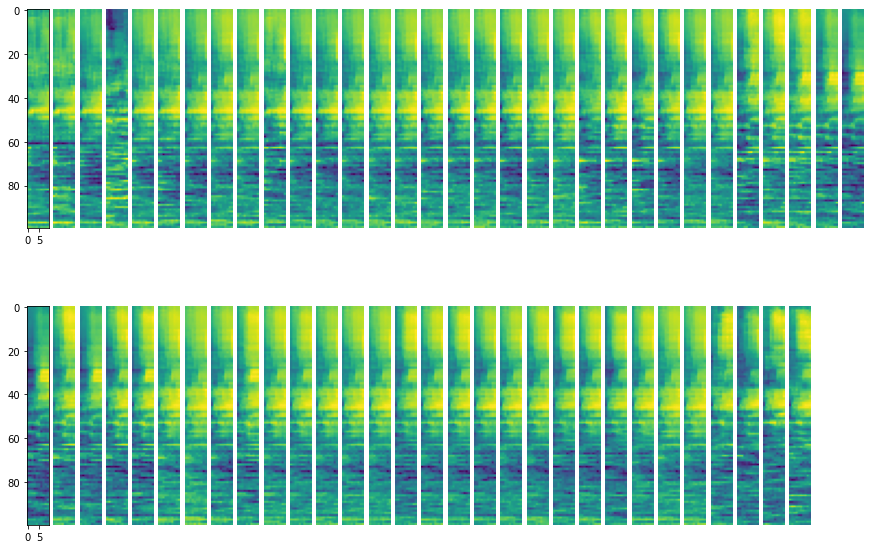

Showing Val Images
Showing Train Images
batch number: 50
label (move = 0, sleep = 1): tensor(1., device='cuda:0')


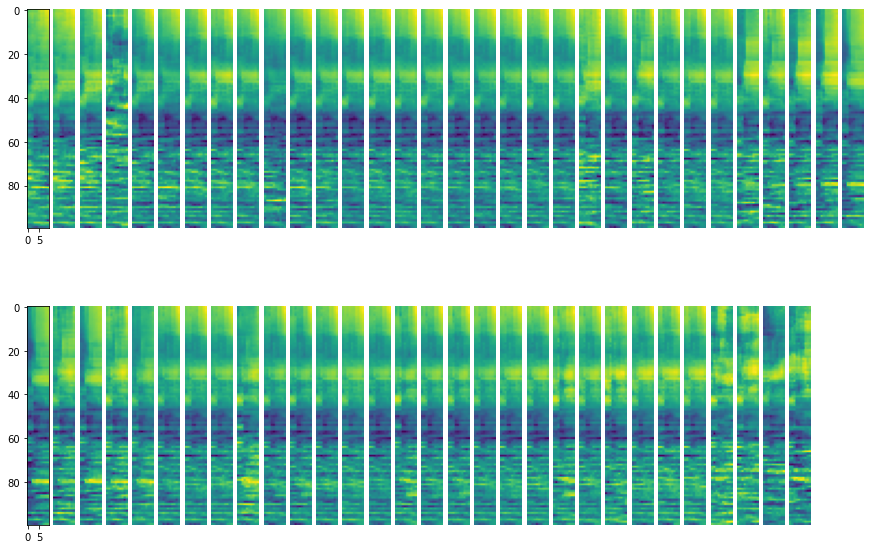

Showing Val Images
Showing Train Images
batch number: 60
label (move = 0, sleep = 1): tensor(1., device='cuda:0')


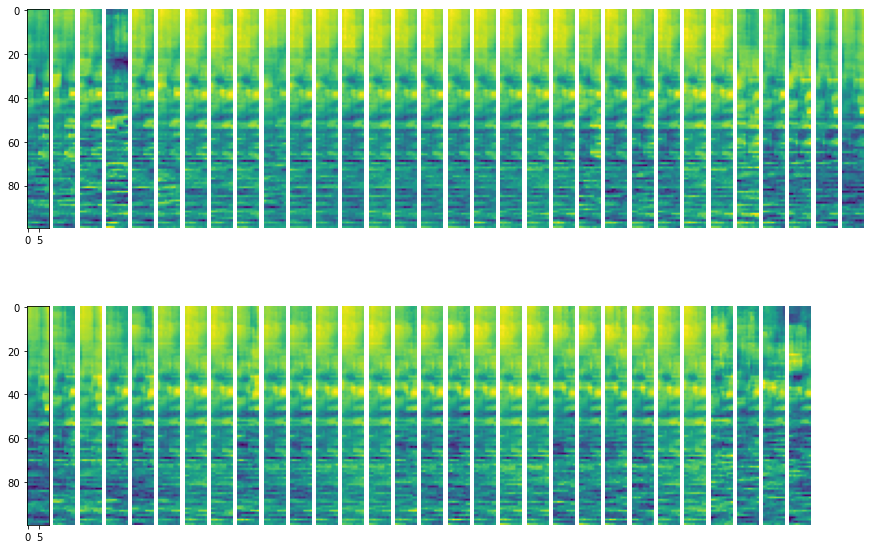

Val loss for epoch 0: 0.9078102111816406
Train loss for epoch 1: 0.42730966210365295
Val loss for epoch 1: 0.3346945643424988
Train loss for epoch 2: 0.500318706035614
Val loss for epoch 2: 0.5105071067810059
Train loss for epoch 3: 0.432284951210022
Val loss for epoch 3: 0.8404704928398132
Train loss for epoch 4: 0.3981854021549225
Val loss for epoch 4: 0.4521082043647766
Train loss for epoch 5: 0.33165252208709717
Val loss for epoch 5: 0.4241606593132019
Train loss for epoch 6: 0.300645112991333
Val loss for epoch 6: 0.43593430519104004
Train loss for epoch 7: 0.27733707427978516
Val loss for epoch 7: 0.7039569616317749
Train loss for epoch 8: 0.2683378756046295
Val loss for epoch 8: 0.4222903549671173
Train loss for epoch 9: 0.2232901155948639
Val loss for epoch 9: 0.6534275412559509
Train loss for epoch 10: 0.237711563706398
Val loss for epoch 10: 0.8425055742263794


KeyboardInterrupt: 

In [42]:
model = CNN().to(device)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)

training_losses = []
val_losses = []
training_acc = []
val_acc = []

train_predictions = []
validation_predictions = []
train_labels = []
validation_labels = []

for epoch in range(num_epochs):
    avg_train_loss, train_accuracy, train_preds, train_labs = train(train_loader, epoch)
    print('Train loss for epoch {}: {}'.format(epoch, avg_train_loss))
    val_loss, val_accuracy, val_preds, val_labels = test(val_loader, epoch)
    print('Val loss for epoch {}: {}'.format(epoch, val_loss))
    
    training_losses.append(avg_train_loss)
    training_acc.append(train_accuracy)
    val_losses.append(val_loss)
    val_acc.append(val_accuracy)
    
    train_predictions.append(train_preds)
    train_labels.append(train_labs)
    validation_predictions.append(val_preds)
    validation_labels.append(val_labels)